<a href="https://colab.research.google.com/github/gvplacencia/AI/blob/main/Copy_of_pix2pix_updated.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Importing TensorFlow and other necessary libraries
import tensorflow as tf  # TensorFlow is an open-source library for machine learning
from tensorflow.keras import layers  # Keras is a high-level API for building and training deep learning models
import os  # The os module provides functions to interact with the operating system
import time  # The time module provides functions for time-related tasks
import matplotlib.pyplot as plt  # Matplotlib is a plotting library for creating static, animated, and interactive visualizations
from IPython.display import clear_output  # IPython.display.clear_output is used to clear the output of the current cell

In [ ]:
dataset_name = "facades" #@param ["cityscapes", "edges2handbags", "edges2shoes", "facades", "maps", "night2day"]


In [ ]:
import pathlib
_URL = f'http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/{dataset_name}.tar.gz'

path_to_zip = tf.keras.utils.get_file(
    fname=f"{dataset_name}.tar.gz",
    origin=_URL,
    extract=True)

path_to_zip  = pathlib.Path(path_to_zip)

PATH = path_to_zip.parent/dataset_name

30168306/30168306 [==============================] - 6s 0us/step


In [ ]:
#Each original image is of size 256 x 512 containing two 256 x 256 images:

sample_image = tf.io.read_file(str(PATH / 'train/1.jpg')) #read the image file
sample_image = tf.io.decode_jpeg(sample_image) #decode the image in jpeg
print(sample_image.shape)#H,W,C

(256, 512, 3)


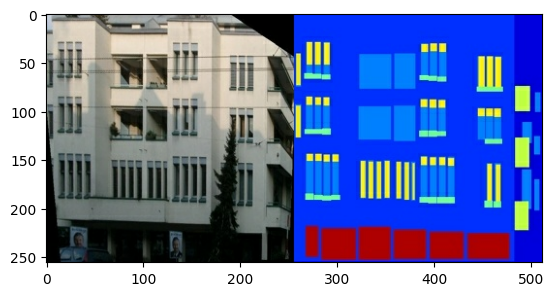

In [ ]:
plt.figure()
plt.imshow(sample_image)

You need to separate real building facade images from the architecture label images—all of which will be of size 256 x 256.

Define a function that loads image files and outputs two image tensors:

In [ ]:
# Function to load an image and resize it to the specified dimensions
def load(image_file):
    image = tf.io.read_file(image_file)  # Read the image file
    image = tf.image.decode_jpeg(image)  # Decode the image as a JPEG file

    w = tf.shape(image)[1]  # Get the width of the image
    w = w // 2  # Divide the width by 2 (centre point of an image)

    real_image = image[:, :w, :]  # Get the real part of the image
    input_image = image[:, w:, :]  # Get the input part of the image

    input_image = tf.cast(input_image, tf.float32)  # Cast the input image to float32
    real_image = tf.cast(real_image, tf.float32)  # Cast the real image to float32

    return input_image, real_image  # Return the input and real images

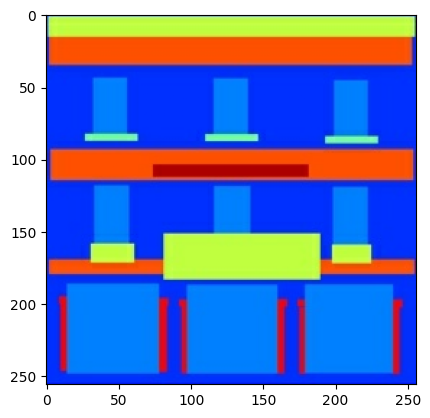

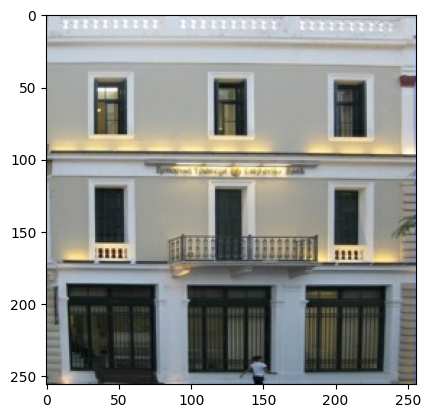

In [ ]:
#plot a sample
inp, re = load(str(PATH / 'train/50.jpg'))
# Casting to int for matplotlib to display the images
plt.figure()
plt.imshow(inp / 255.0)
plt.figure()
plt.imshow(re / 255.0)

As described in the pix2pix paper{:.external}, you need to apply random jittering and mirroring to preprocess the training set.

Define several functions that:

Resize each 256 x 256 image to a larger height and width—286 x 286.

Randomly crop it back to 256 x 256.

Randomly flip the image horizontally i.e., left to right (random mirroring).

Normalize the images to the [-1, 1] range.

In [ ]:
# The facade training set consist of 400 images
BUFFER_SIZE = 400
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [ ]:
# Function to resize an image to the specified height and width
def resize(input_image, real_image, height, width):
    input_image = tf.image.resize(input_image, [height, width],method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)  # Resize the input image
    real_image = tf.image.resize(real_image, [height, width],method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)  # Resize the real image

    return input_image, real_image  # Return the resized images

In [ ]:
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

In [ ]:
# Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [ ]:
@tf.function()
def random_jitter(input_image, real_image):
  # Resizing to 286x286
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # Random cropping back to 256x256
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

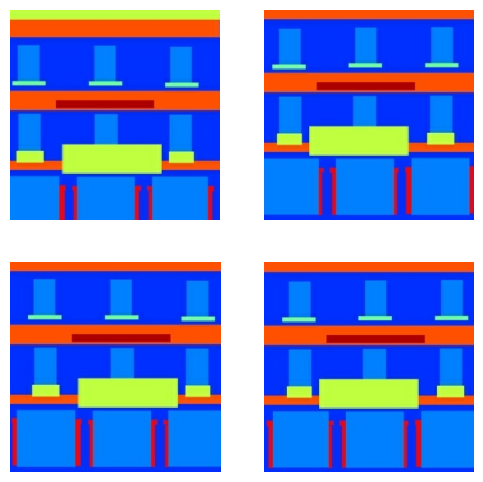

In [ ]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)
  plt.subplot(2, 2, i + 1)
  plt.imshow(rj_inp / 255.0)
  plt.axis('off')
plt.show()

Having checked that the loading and preprocessing works, let's define a couple of helper functions that load and preprocess the training and test sets:

In [ ]:
# Function to load and preprocess the training dataset
def load_image_train(image_file):
    input_image, real_image = load(image_file)  # Load the image
    input_image, real_image = random_jitter(input_image, real_image)  # Apply random jittering
    input_image, real_image = normalize(input_image, real_image)  # Normalize the images

    return input_image, real_image

In [ ]:
# Function to load and preprocess the test dataset
def load_image_test(image_file):
    input_image, real_image = load(image_file)  # Load the image
    input_image, real_image = resize(input_image, real_image, 256, 256)  # Resize the images
    input_image, real_image = normalize(input_image, real_image)  # Normalize the images

    return input_image, real_image

In [ ]:
train_dataset = tf.data.Dataset.list_files(str(PATH / 'train/*.jpg'))
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [ ]:
try:
  test_dataset = tf.data.Dataset.list_files(str(PATH / 'test/*.jpg'))
except tf.errors.InvalidArgumentError:
  test_dataset = tf.data.Dataset.list_files(str(PATH / 'val/*.jpg'))
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

Build the generator

The generator of your pix2pix cGAN is a modified U-Net{:.external}. A U-Net consists of an encoder (downsampler) and decoder (upsampler). (You can find out more about it in the Image segmentation tutorial and on the U-Net project website{:.external}.)

Each block in the encoder is: Convolution -> Batch normalization -> Leaky ReLU

Each block in the decoder is: Transposed convolution -> Batch normalization -> Dropout (applied to the first 3 blocks) -> ReLU

There are skip connections between the encoder and decoder (as in the U-Net).

In [ ]:
OUTPUT_CHANNELS = 3

In [ ]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02) # Initialize kernel weights

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [ ]:
#testing the downsample function
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0)) #feeding the inpput image of size (256,256,3)
print (down_result.shape)

(1, 128, 128, 3)


In [ ]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [ ]:
#test the decoder
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 256, 256, 3)


In [ ]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x) # Apply the downsample layer to the input tensor x
    skips.append(x) # Store the output of each downsample layer in skips

  skips = reversed(skips[:-1]) # Reverse the list of skip connections, excluding the last one

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x) # Apply the upsample layer to the input tensor x
    x = tf.keras.layers.Concatenate()([x, skip]) ## Concatenate the upsampled tensor with the corresponding skip connection

  x = last(x) # Apply the final layer to the tensor x

  return tf.keras.Model(inputs=inputs, outputs=x) # Return the model with specified inputs and outputs

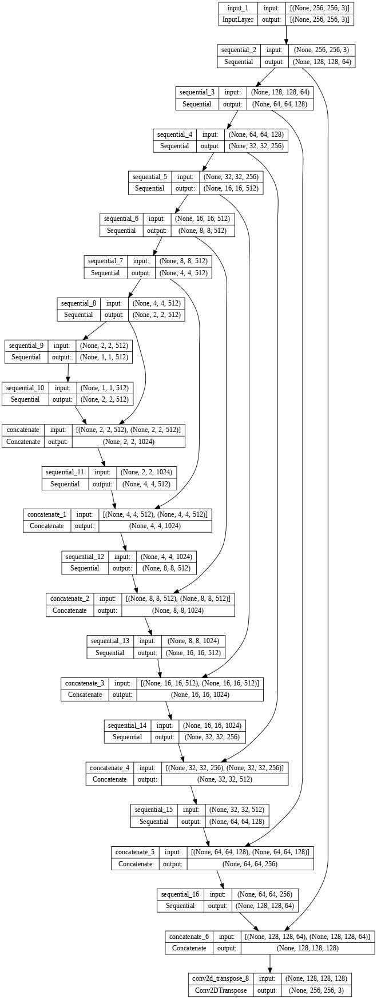

In [ ]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

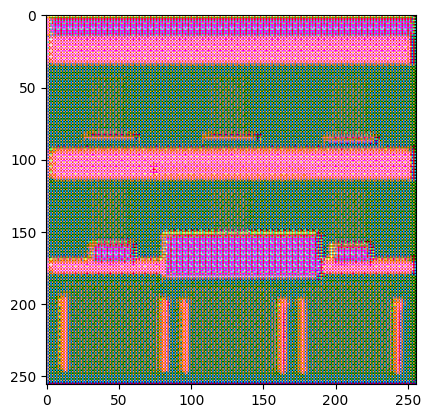

In [ ]:
gen_output = generator(inp[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

### Define the generator loss

GANs learn a loss that adapts to the data, while cGANs learn a structured loss that penalizes a possible structure that differs from the network output and the target image, as described in the [pix2pix paper](https://arxiv.org/abs/1611.07004){:.external}.

- The generator loss is a sigmoid cross-entropy loss of the generated images and an **array of ones**.
- The pix2pix paper also mentions the L1 loss, which is a MAE (mean absolute error) between the generated image and the target image.
- This allows the generated image to become structurally similar to the target image.
- The formula to calculate the total generator loss is `gan_loss + LAMBDA * l1_loss`, where `LAMBDA = 100`. This value was decided by the authors of the paper.

In [ ]:
LAMBDA = 100
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

Build the discriminator

The discriminator in the pix2pix cGAN is a convolutional PatchGAN classifier—it tries to classify if each image patch is real or not real, as described in the pix2pix paper{:.external}.

Each block in the discriminator is: Convolution -> Batch normalization -> Leaky ReLU.

The shape of the output after the last layer is (batch_size, 30, 30, 1).

Each 30 x 30 image patch of the output classifies a 70 x 70 portion of the input image.

The discriminator receives 2 inputs:

The input image and the target image, which it should classify as real.

The input image and the generated image (the output of the generator), which it should classify as fake.

Use tf.concat([inp, tar], axis=-1) to concatenate these 2 inputs together.

In [ ]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

In [ ]:
discriminator = Discriminator()

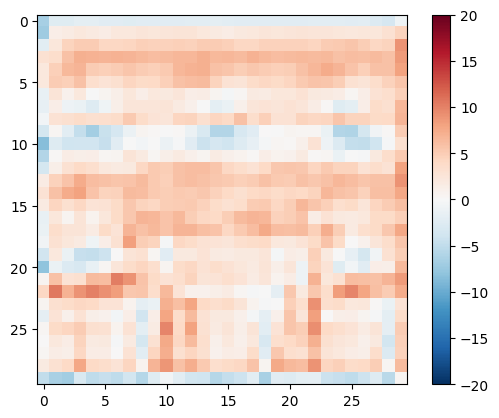

In [ ]:
disc_out = discriminator([inp[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

Define the discriminator loss

The discriminator_loss function takes 2 inputs: real images and generated images.

real_loss is a sigmoid cross-entropy loss of the real images and an array of ones(since these are the real images).

generated_loss is a sigmoid cross-entropy loss of the generated images and an array of zeros (since these are the fake images).

The total_loss is the sum of real_loss and generated_loss.

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

Generate images

Write a function to plot some images during training.

Pass images from the test set to the generator.

The generator will then translate the input image into the output.

The last step is to plot the predictions and voila!

In [ ]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

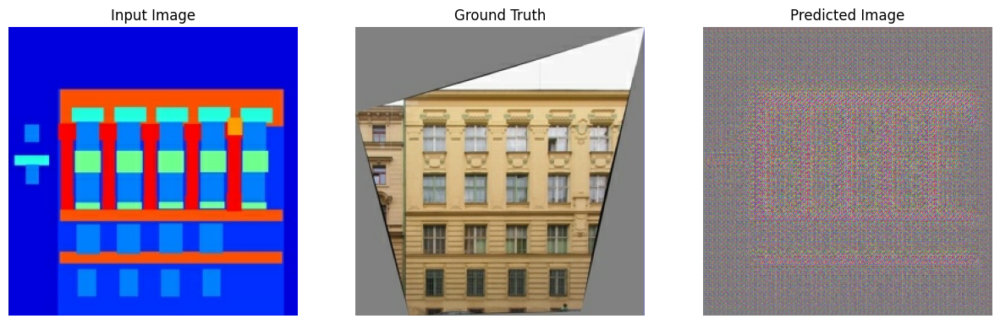

In [ ]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)


Training

For each example input generates an output.

The discriminator receives the input_image and the generated image as the first input. The second input is the input_image and the target_image.

Next, calculate the generator and the discriminator loss.

Then, calculate the gradients of loss with respect to both the generator and the discriminator variables(inputs) and apply those to the optimizer.

Finally, log the losses to TensorBoard.

In [ ]:
import datetime
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [ ]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

The actual training loop. Since this tutorial can run of more than one dataset, and the datasets vary greatly in size the training loop is setup to work in steps instead of epochs.

Iterates over the number of steps.

Every 10 steps print a dot (.).

Every 1k steps: clear the display and run generate_images to show the progress.

Every 5k steps: save a checkpoint.

In [ ]:
# Define the fit function to train the model
def fit(train_ds, test_ds, steps):
    # Get a single batch of data from the test dataset
    example_input, example_target = next(iter(test_ds.take(1)))

    # Record the start time
    start = time.time()

    # Iterate over the training dataset for a specified number of steps
    for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
        # Every 1000 steps, clear the output and display progress
        if (step) % 1000 == 0:
            clear_output(wait=True)

            # If it's not the first step, print the time taken for the last 1000 steps
            if step != 0:
                print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

            # Reset the start time for the next 1000 steps
            start = time.time()

            # Generate and display images using the generator
            generate_images(generator, example_input, example_target)
            print(f"Step: {step//1000}k")

        # Perform a training step
        train_step(input_image, target, step)

        # Print a dot every 10 steps to show progress
        if (step+1) % 10 == 0:
            print('.', end='', flush=True)

        # Save the model checkpoint every 5000 steps
        if (step + 1) % 5000 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)


test_ds.take(1): Takes one batch from the test dataset.

iter(): Creates an iterator over this batch.

next(): Retrieves the first (and only) element from the iterator, which consists of an example input image and its corresponding target image.

train_ds.repeat(): Repeats the training dataset indefinitely.

take(steps): Takes a specified number of steps from the repeated dataset.

enumerate(): Enumerates over the dataset, providing both the step index (step) and the data (input_image, target).


In [ ]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 25758), started 0:03:41 ago. (Use '!kill 25758' to kill it.)

<IPython.core.display.Javascript object>

Time taken for 1000 steps: 97.63 sec



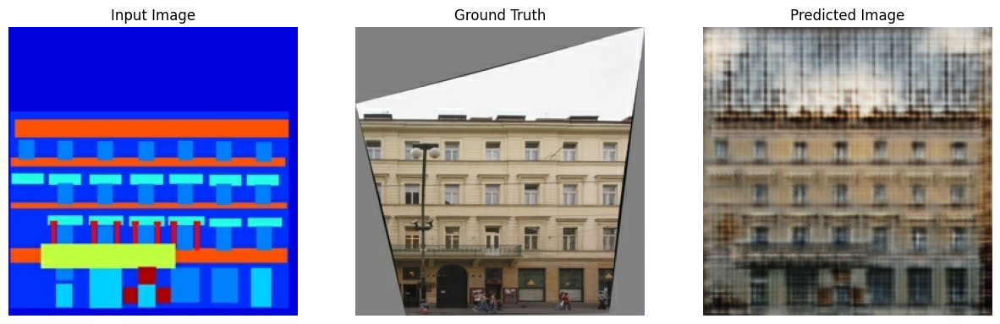

Step: 3k
...........

In [ ]:

fit(train_dataset, test_dataset, steps=40000)